# Dataset Preperation

In [1]:
import pandas as pd
import numpy as np

path_1="datasets/UNH.csv"
path_2="datasets/PFE.csv"
path_3="datasets/MRK.csv"

asset_1 = pd.read_csv(path_1)
asset_2 = pd.read_csv(path_2)
asset_3 = pd.read_csv(path_3)

asset_1["Date"] = pd.to_datetime(asset_1["Date"]).dt.strftime("%Y-%m-%d")
asset_2["Date"] = pd.to_datetime(asset_2["Date"]).dt.strftime("%Y-%m-%d")
asset_3["Date"] = pd.to_datetime(asset_3["Date"]).dt.strftime("%Y-%m-%d")

start_date="2023-08-23"
start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date].index[0]

# Slice the historical data from start_date onwards
historical_prices_1 = asset_1["Close"].iloc[start_index:].values
historical_prices_2 = asset_2["Close"].iloc[start_index:].values
historical_prices_3 = asset_3["Close"].iloc[start_index:].values
historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
S0 = historical_prices[0, :]
barrier = S0 * 0.59
print(f"Price at initial fixing date: {S0}")
print(f"Barrier Price: {barrier}")

Price at initial fixing date: [480.22924805  34.61804962 107.69082642]
Barrier Price: [283.33525635  20.42464928  63.53758759]


# Model

### Multi-Asset Black-Scholes Model

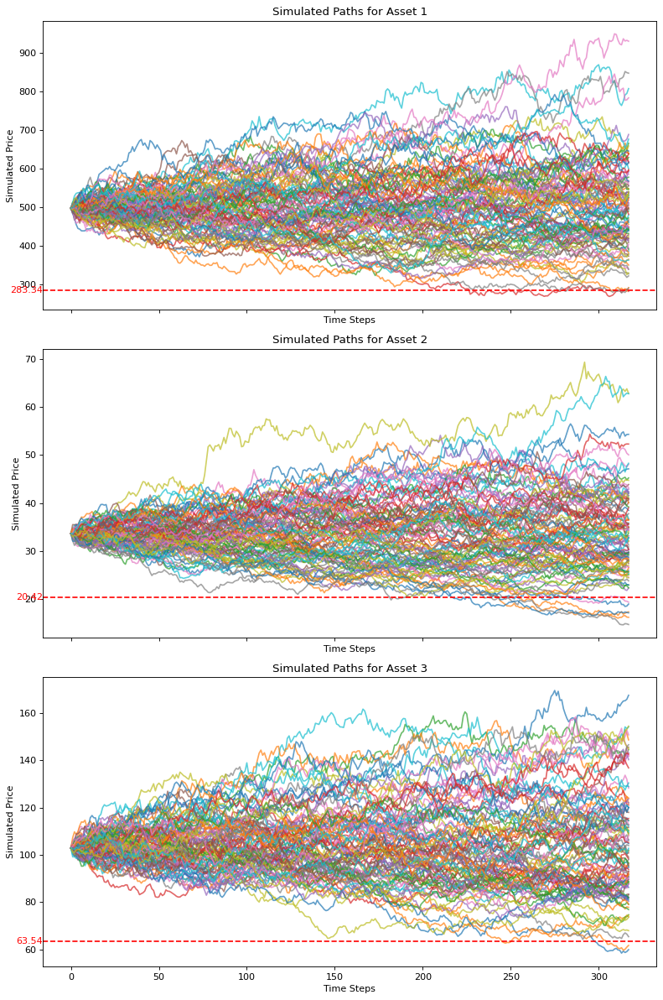

In [2]:
from GBM import MultiBS

multi_bs = MultiBS()
M=100_000
forward_simulation = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M)
v, sigma = multi_bs.calibrate_model(forward_simulation)
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=100)
multi_bs.plot(simul)

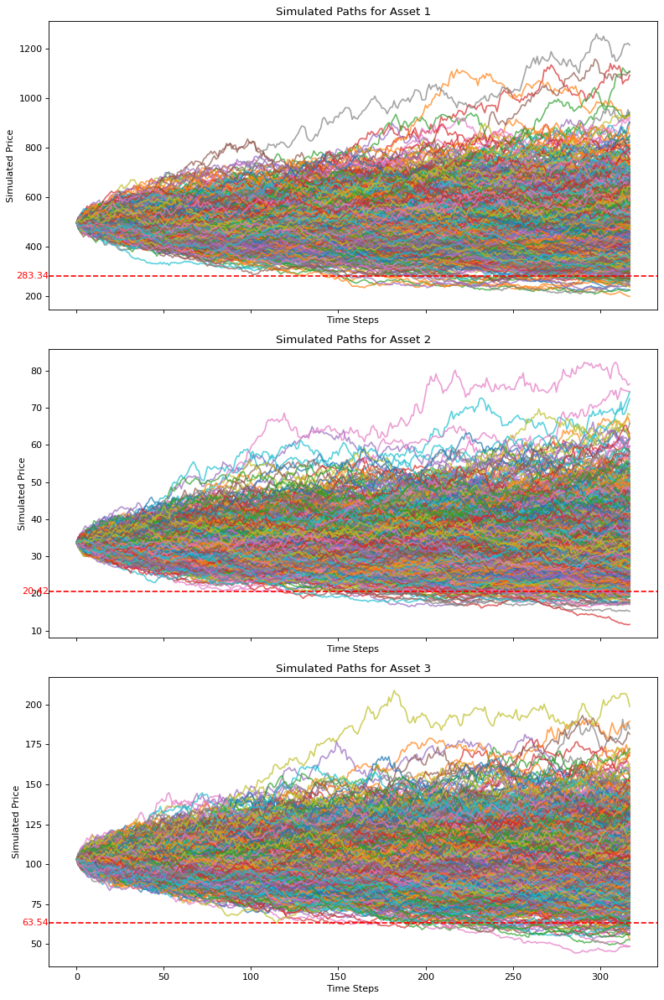

Variance of the final price for asset 1: 18144.554945303447
Variance of the final price for asset 2: 92.14387219049564
Variance of the final price for asset 3: 523.1645891215029


array([[2.21599142e-04, 6.83210639e-05, 5.08312467e-05],
       [6.83210639e-05, 2.32960389e-04, 6.36191751e-05],
       [5.08312467e-05, 6.36191751e-05, 1.59655883e-04]])

In [5]:
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

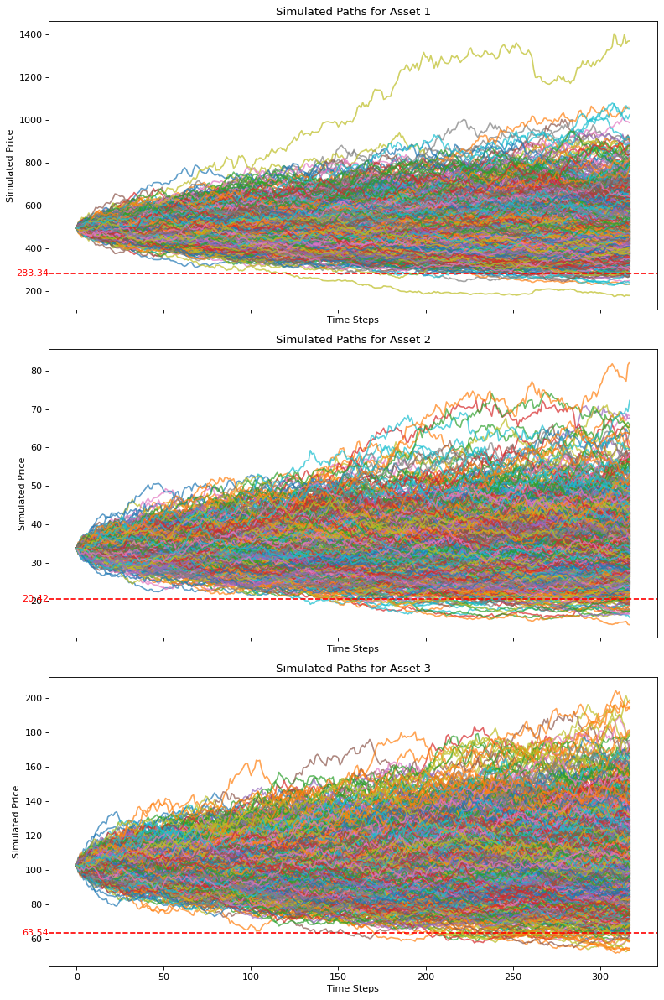

Variance of the final price for asset 1: 2631.379364990385
Variance of the final price for asset 2: 11.237997041258009
Variance of the final price for asset 3: 60.77229484006801


array([[2.20189034e-04, 6.84405479e-05, 5.05329462e-05],
       [6.84405479e-05, 2.34653297e-04, 6.38887763e-05],
       [5.05329462e-05, 6.38887763e-05, 1.60183486e-04]])

In [6]:
simul = multi_bs.simulate_multi_GBM_antithetic(m=317, M=1000)
multi_bs.plot(simul)
x = simul[:,:,:500] + simul[:,:,500:] 
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(x[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

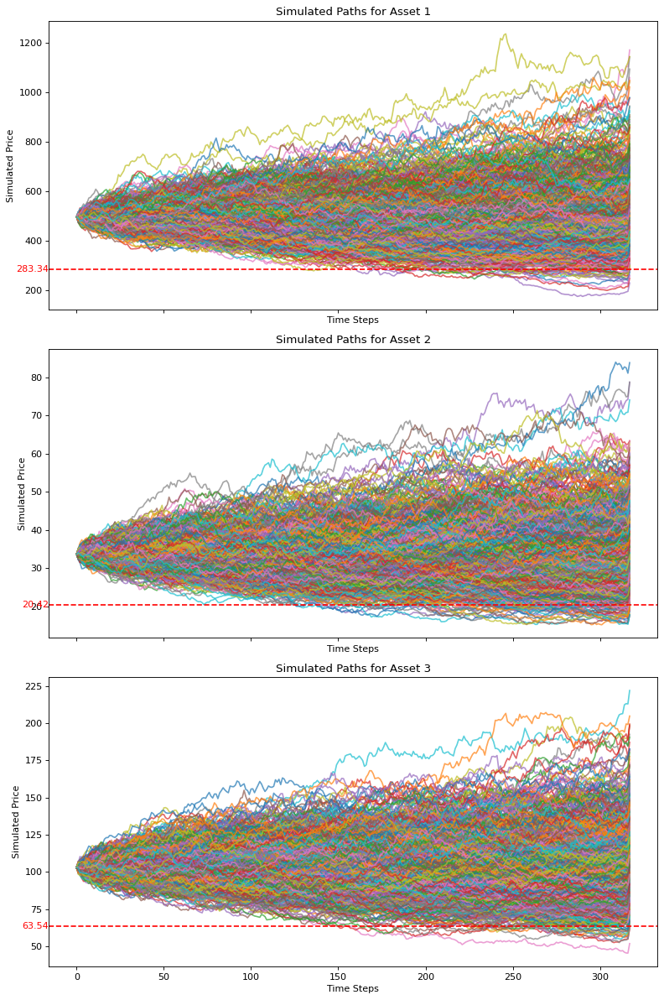

Variance of the final price for asset 1: 19339.954346519928
Variance of the final price for asset 2: 83.37068805482029
Variance of the final price for asset 3: 589.1539929863392


array([[2.39834295e-04, 8.63785868e-05, 6.66075637e-05],
       [8.63785868e-05, 2.52719765e-04, 7.99512285e-05],
       [6.66075637e-05, 7.99512285e-05, 1.74696885e-04]])

In [7]:
simul = multi_bs.simulate_multi_GBM_control_variate(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

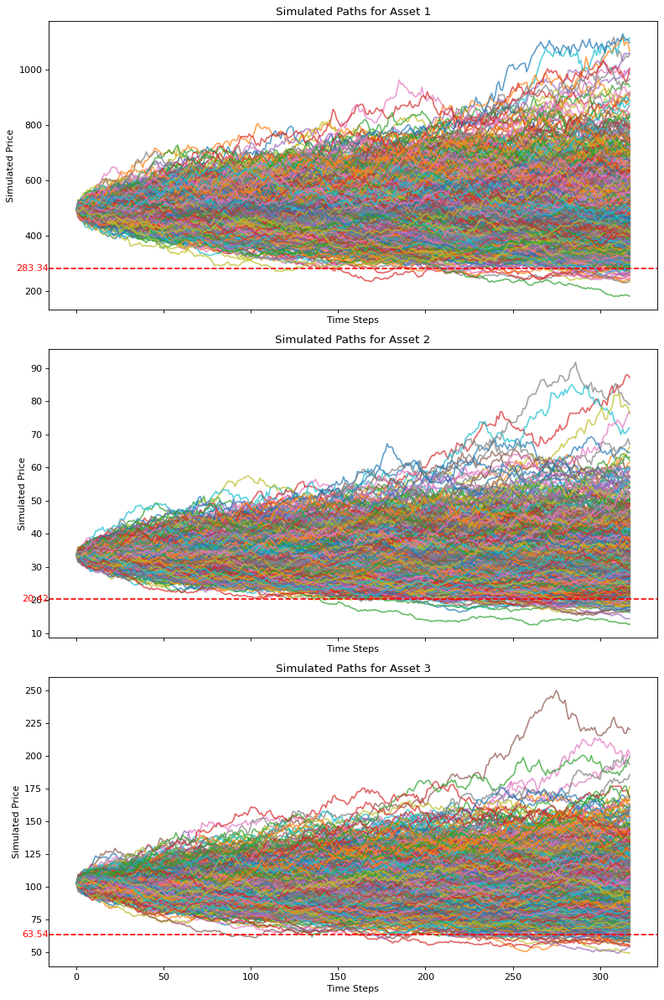

Variance of the final price for asset 1: 18215.909765387052
Variance of the final price for asset 2: 86.07769068880789
Variance of the final price for asset 3: 536.1391151552571


array([[2.22130731e-04, 6.84666991e-05, 5.05728529e-05],
       [6.84666991e-05, 2.34021188e-04, 6.33958885e-05],
       [5.05728529e-05, 6.33958885e-05, 1.59761361e-04]])

In [8]:
simul = multi_bs.simulate_multi_GBM_stratified(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

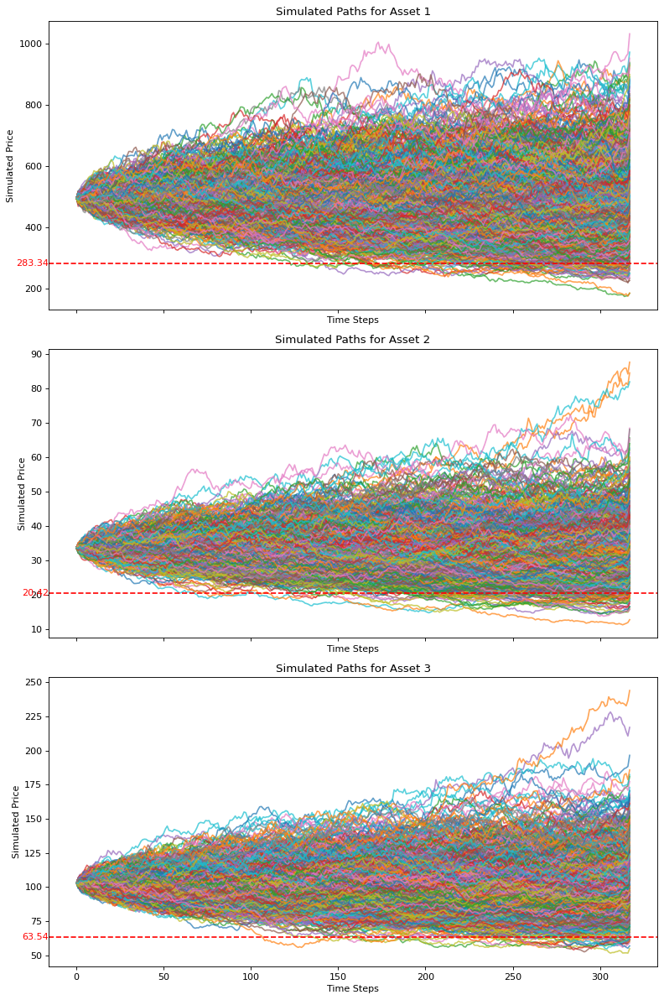

Variance of the final price for asset 1: 18800.729643207775
Variance of the final price for asset 2: 87.45407797201712
Variance of the final price for asset 3: 575.5995708252921


array([[2.29804815e-04, 7.69657483e-05, 5.63054609e-05],
       [7.69657483e-05, 2.42872252e-04, 6.99126357e-05],
       [5.63054609e-05, 6.99126357e-05, 1.63618957e-04]])

In [9]:
simul = multi_bs.simulate_multi_GBM_importance_sampling(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

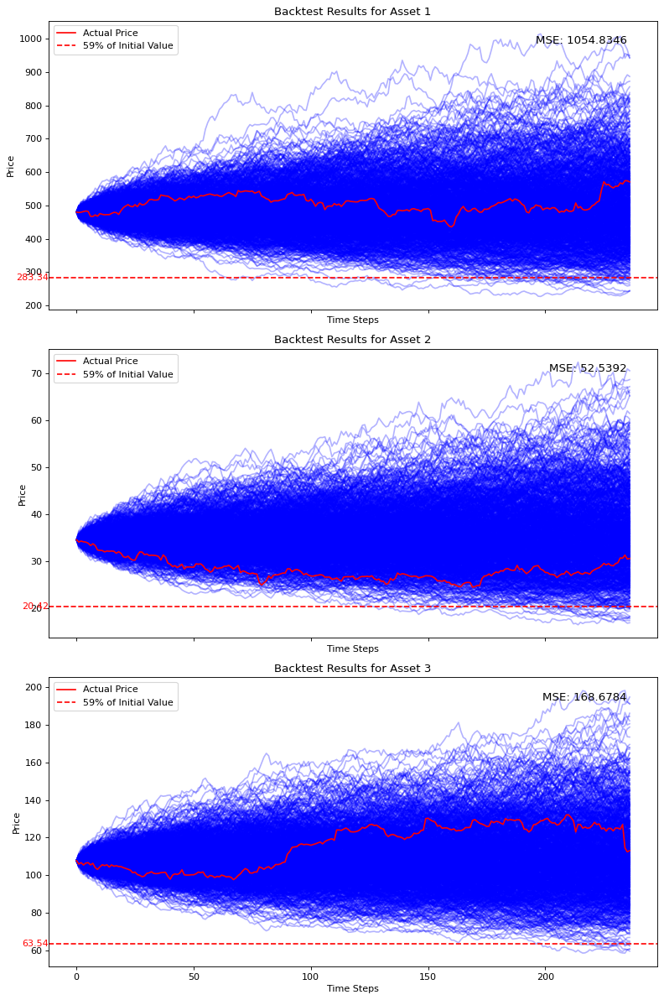

Mean Squared Error (MSE) for each asset: [1054.83463512   52.53915038  168.67844393]
Root Mean Squared Error (RMSE) for each asset: [32.47821786  7.2483895  12.98762657]


array([1054.83463512,   52.53915038,  168.67844393])

In [28]:
multi_bs.backtest(M=1000)

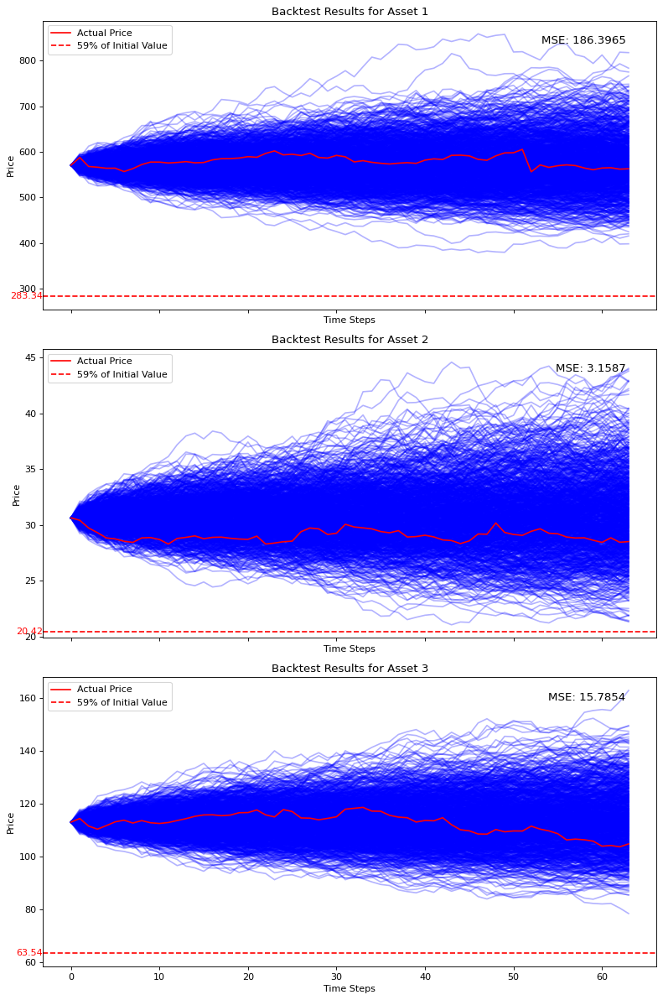

Mean Squared Error (MSE) for each asset: [186.39647709   3.15867777  15.78536451]
Root Mean Squared Error (RMSE) for each asset: [13.65270951  1.77726694  3.97307998]


array([186.39647709,   3.15867777,  15.78536451])

In [ ]:
multi_bs.backtest(M=1000, start_date="2024-08-01", end_date="2024-10-30")

### Heston Model

In [23]:
import torch
from heston_model import HestonModel


standard_normal = torch.distributions.Normal(torch.tensor([0]), 1)
s0 = torch.tensor([489.44, 36.65, 111])
r = 0.0419
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
standard_normal = torch.distributions.Normal(torch.tensor([0]).to(device), torch.tensor([1]).to(device))
S0 = torch.tensor(S0)
barrier = 0.59 * S0

r = 0.0419
heston = HestonModel()

C:\Users\JHong\AppData\Local\Temp\ipykernel_47336\1950759049.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  S0 = torch.tensor(S0)


In [24]:
params, cov = heston.MLE()
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)
uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

In [25]:
import matplotlib.pyplot as plt
def plot(simulated_data, show_barrier=True, barrier=barrier):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each path for asset i
        ax.plot(simulated_data[i], alpha=0.7)
        if show_barrier:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Simulated Paths for Asset {i+1}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Simulated Price')

    plt.tight_layout()
    plt.show()


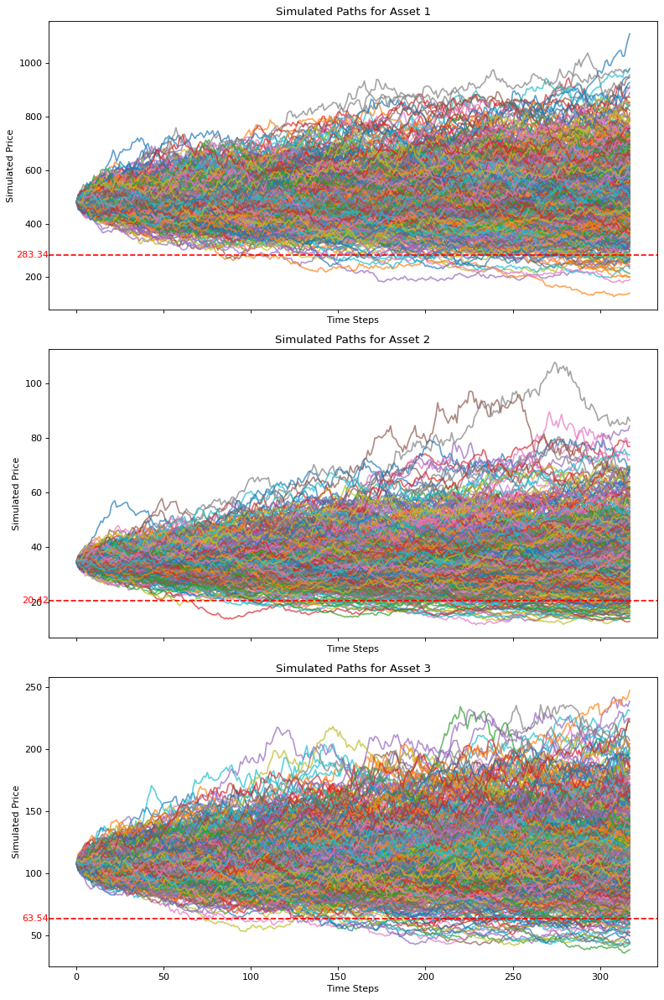

In [26]:
plot(torch.exp(path[1:,:,:,0].permute(1, 2, 0).cpu().detach()))

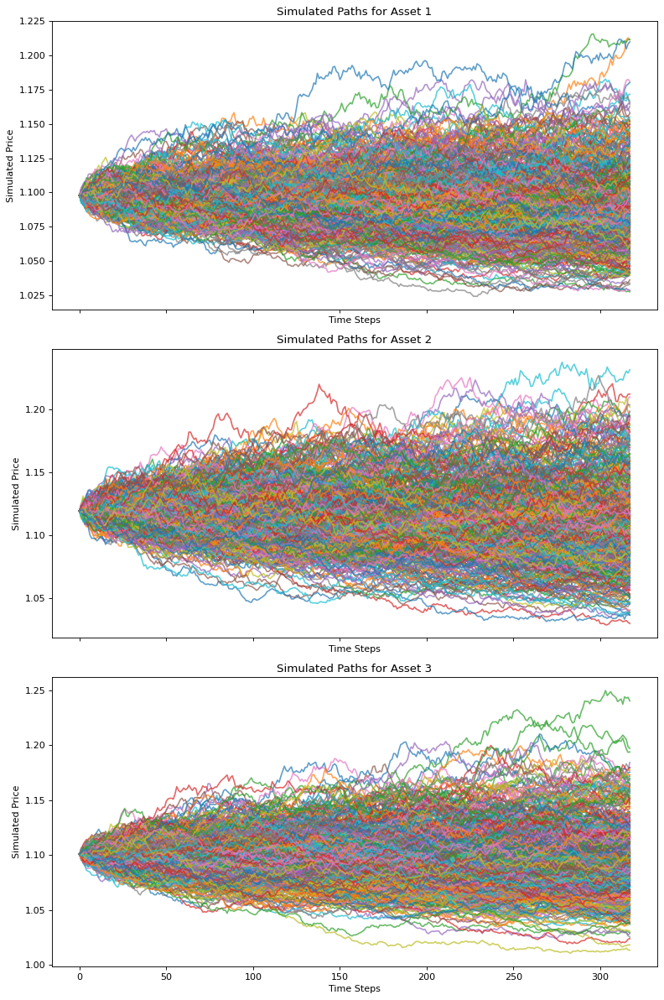

In [27]:
plot(torch.exp(path[1:,:,:,1].permute(1, 2, 0).cpu().detach()), show_barrier=False)

In [34]:
# Plotting function for backtesting
def plot_backtest_results(simulated_data, historical_prices, barrier=None, show_barrier=False):
    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths
    mse = np.mean((simulated_data[:, :len(historical_prices), :].mean(axis=2) - historical_prices.T) ** 2, axis=1)

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)
        
    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each simulated path for asset i
        for path in range(M):
            ax.plot(simulated_data[i, :, path], color='blue', alpha=0.3)
        # Plot the actual historical price path for asset i
        ax.plot(historical_prices[:, i], color='red', label="Actual Price")
        ax.annotate(f'MSE: {mse[i]:.4f}', xy=(0.95, 0.95), xycoords='axes fraction', horizontalalignment='right', verticalalignment='top', fontsize=12)
        if show_barrier and barrier is not None:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Backtest Results for Asset {i+1}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Price')
        ax.legend(loc='upper left')
    
    plt.tight_layout()
    plt.show()

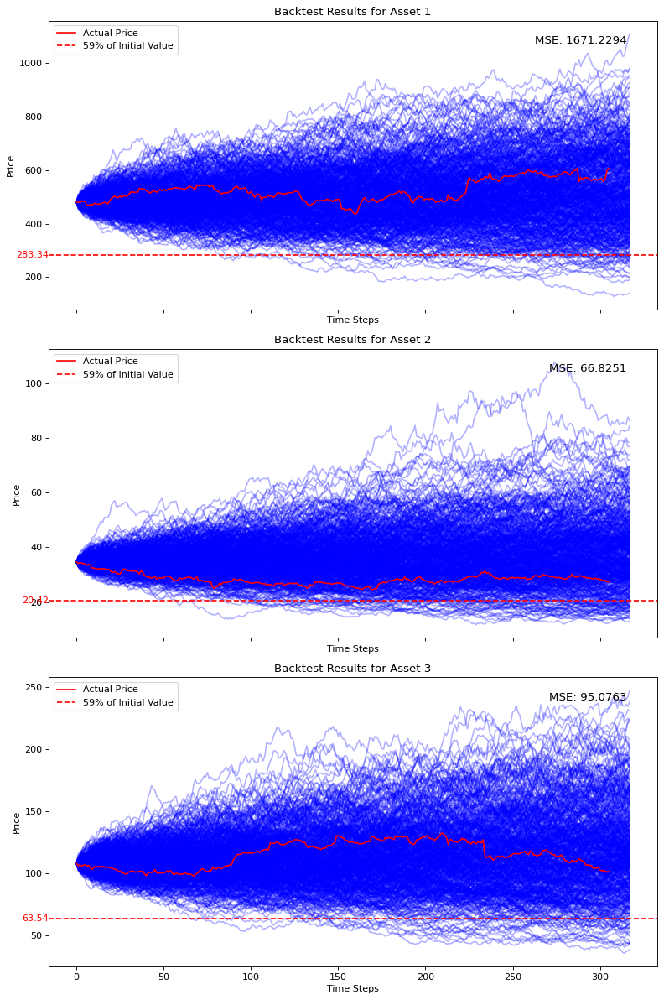

In [37]:
plot_backtest_results(simulated_data=torch.exp(path[1:,:,:,0].permute(1, 2, 0)).cpu().numpy(), historical_prices=historical_prices, barrier=barrier, show_barrier=True)

### DCC-GARCH Model

In [ ]:
from process_data import GARCH
garch = GARCH()
garch.fit(True)
m = 317
M = 100_000
forecast = garch.forecast(m, M)

c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:78: RuntimeWarning: invalid value encountered in scalar divide
  Omega = Omega + iota_norm**-1 * (-1 + denom * (k - 1) / num) * iota @ iota.T
C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:80: RuntimeWarning: invalid value encountered in sqrt
  xi = -np.sqrt(nu / np.pi) * (g1 / g2) * (Omega @ iota) / np.sqrt(1 + iota.T @ Omega @ iota)
c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:81: RuntimeWarning: invalid value encountered in log
  loss = (len(shocks) - 1) * (np.log(sp.special.gamma((nu + 3) / 2)) - 0.5 * np.log(np.linalg.det(Omega)) \


Optimised parameters:
a: 0.7349502742816074
b: 0.002637722355226774
nu: 2.0016082308704406
iota: [[-1.1370089 ]
 [ 0.85042592]
 [ 0.95195043]]


C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


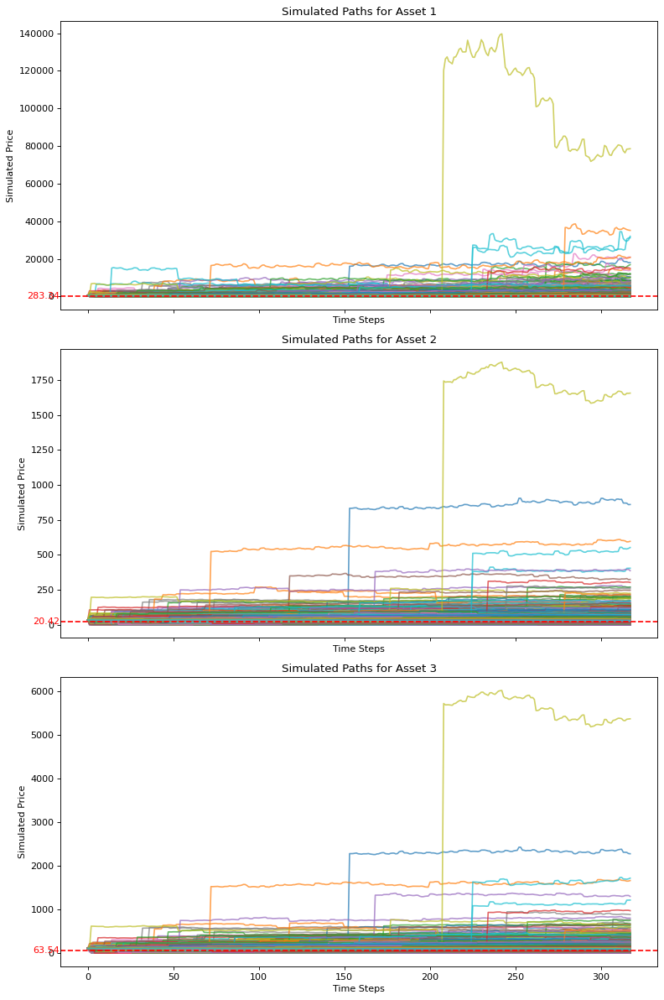

In [19]:
plot(forecast.transpose(1, 2, 0))

C:\Users\JHong\AppData\Local\Temp\ipykernel_47336\63513931.py:1: RuntimeWarning: divide by zero encountered in log
  plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)


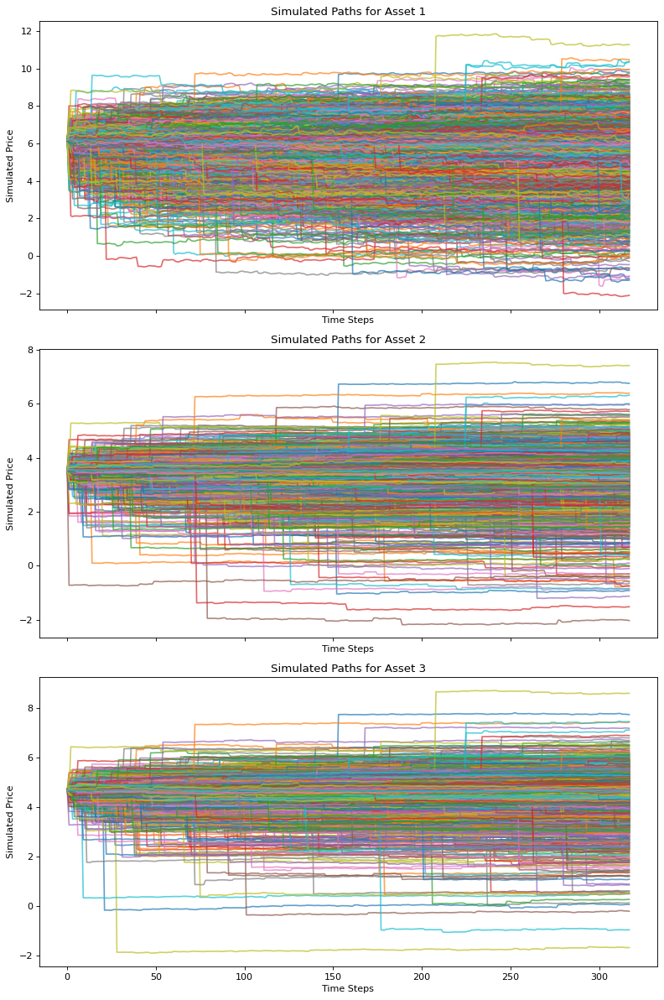

In [22]:
plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


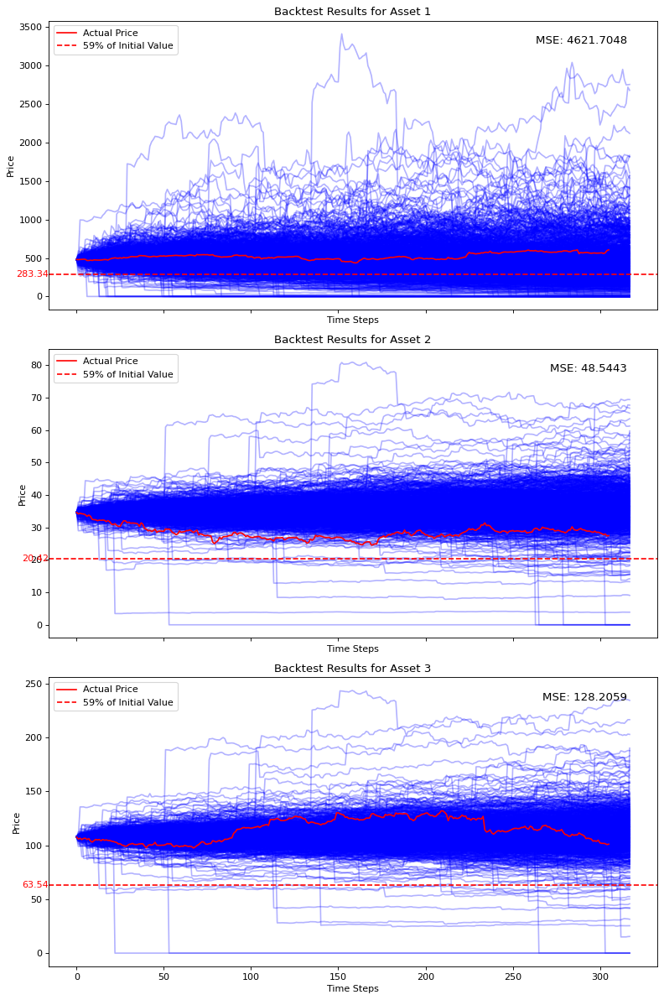

In [40]:
m = 317
M = 1_000
forecast = garch.forecast(m, M)
plot_backtest_results(simulated_data=forecast.transpose(1, 2, 0), historical_prices=historical_prices, barrier=barrier, show_barrier=True)

# Evaluating Payoff

### Under Black-Scholes Model

Training the callable payoff function

In [ ]:
from payoff import CallablePayoff
from tqdm import tqdm

S0 = historical_prices[0,:]
bs_payoff = CallablePayoff(0, r=0.0419, S0=S0)
M = 10_000
epochs = 200
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        path = path.transpose(2, 0, 1)
        losses = bs_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


Training Progress:  34%|███▍      | 69/200 [03:00<05:21,  2.46s/it, Worst loss=5.46e+3, Best Loss=5.33e+3]

In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 429.061878606914


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
x = bs_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 1031.6894556012112


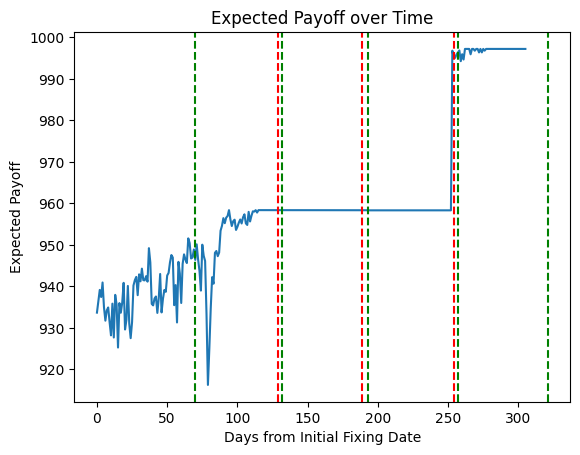

In [ ]:
import matplotlib.pyplot as plt

payout_bs = []
bs_payoff.current_date = 0
t = 0
calling_dates = [129, 189, 254]
payoff_dates = [70, 132, 193, 257, 321]

for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, True).mean()
    payout_bs.append(expected_payoff.item())

plt.plot(payout_bs)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
    
    
plt.title("Expected Payoff over Time")
plt.show()

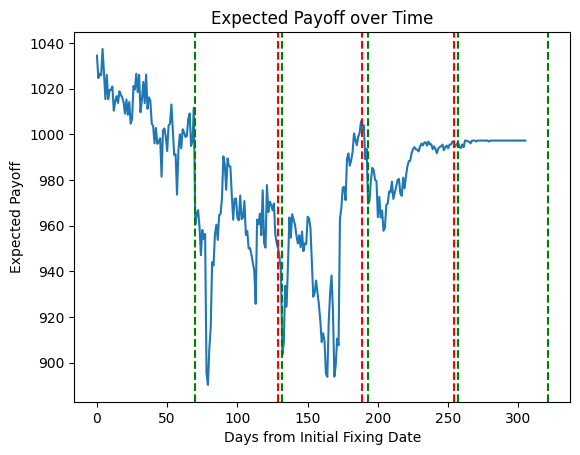

In [ ]:
payout_bs_nc = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, False).mean()
    payout_bs_nc.append(expected_payoff.item())

plt.plot(payout_bs_nc)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
    
plt.title("Expected Payoff over Time")
plt.show()

### Under Heston Model

In [ ]:
from payoff import CallablePayoff
from tqdm import tqdm

heston_payoff = CallablePayoff(0, 0.0419, s0)
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)

params, cov = heston.MLE()
S0 = torch.tensor(S0)
epochs = 2000

with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        
        uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)

        path = heston.multi_asset_path(u, uni, params, r, cov, S0)
        losses = heston_payoff.minimise_over_path(path[:,:,:,0])
        
        pbar.set_postfix({'Worst loss': max(losses), 
                          'Best Loss': min(losses)})
        pbar.update(1)

/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
print(f"Expected Payoff: {returns.mean()}")

Expected Payoff: 792.4415269533448


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)


In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
print(f"Expected Payoff: {returns.mean()}")

Expected Payoff: 920.0510377615163


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/1415949355.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  historical_prices = torch.tensor(historical_prices)


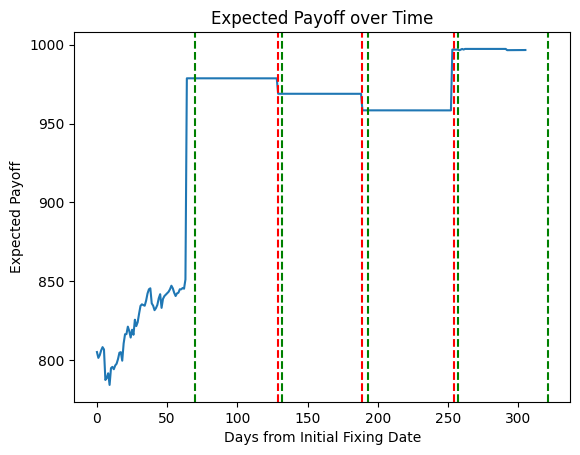

In [ ]:
payout_heston = []
heston_payoff.current_date = 0
t = 0
historical_prices = torch.tensor(historical_prices)

for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.tensor(historical_data), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, True).mean()
    payout_heston.append(expected_payoff.item())

plt.plot(payout_heston)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

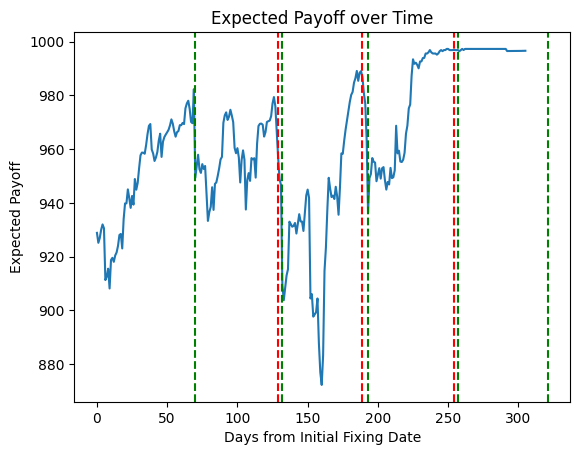

In [ ]:
payout_heston_nc = []
heston_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.tensor(historical_data), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, False).mean()
    payout_heston_nc.append(expected_payoff.item())

plt.plot(payout_heston_nc)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

### Under DCC-GARCH Model

In [ ]:
m = 317
garch_payoff = CallablePayoff(0, r=0.0419, S0=S0.clone().detach())

epochs = 100
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = garch.forecast(steps=m, num_paths=M, s0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        losses = garch_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.S0 = torch.log(torch.tensor(S0)) # In order of UNH, PFE, MRK
Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/4107904332.py:8: RuntimeWarning: divide by zero encountered in log
  path = np.log(path) # in asset, timestep, path
Training Progress:   1%|          | 1/100 [00:00<01:24,  1.17it/s, Worst loss=3.12e+5, Best Loss=3.96e+4]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12

In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1031.6894556012112


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/2670220049.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path)
returns = garch_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1031.6894556012112


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/710950322.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/809854450.py:11: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)
/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_1033

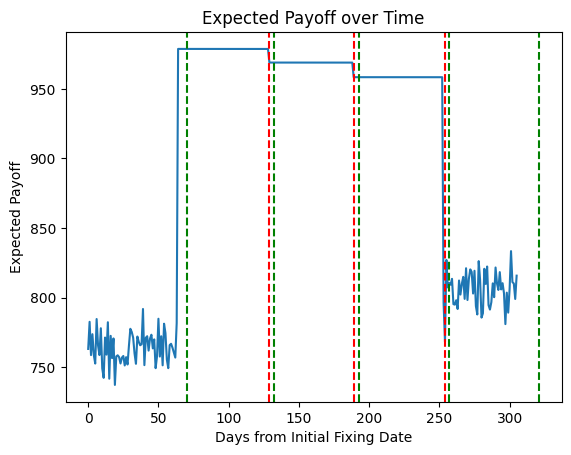

In [ ]:
payout_garch = []
garch_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0)
    path = np.log(path)
    path = torch.cat([torch.tensor(historical_data), torch.tensor(path)], dim=2)
    expected_payoff = garch_payoff.evaluate_payoff(path, True).mean()
    payout_garch.append(expected_payoff.item())

plt.plot(payout_garch)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/2461238982.py:11: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)
/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_103

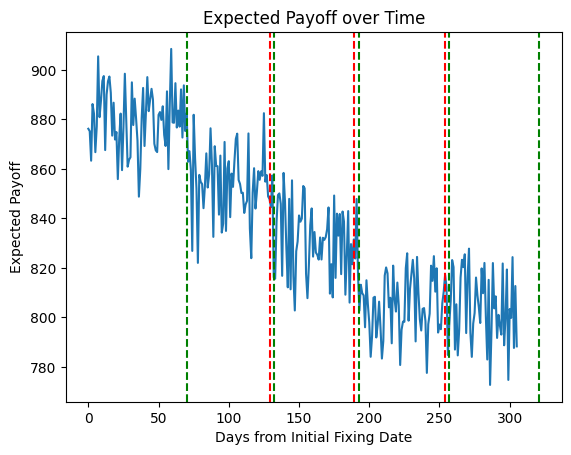

In [ ]:
payout_garch_nc = []
garch_payoff.current_date = 0
t = 0
M = 1000
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(0, 2, 1)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0)
    path = np.log(path)
    path = torch.cat([torch.tensor(historical_data), torch.tensor(path)], dim=2)
    expected_payoff = garch_payoff.evaluate_payoff(path, False).mean()
    payout_garch_nc.append(expected_payoff.item())

plt.plot(payout_garch_nc)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")

for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')

plt.title("Expected Payoff over Time")
plt.show()

### Payoff Comparison

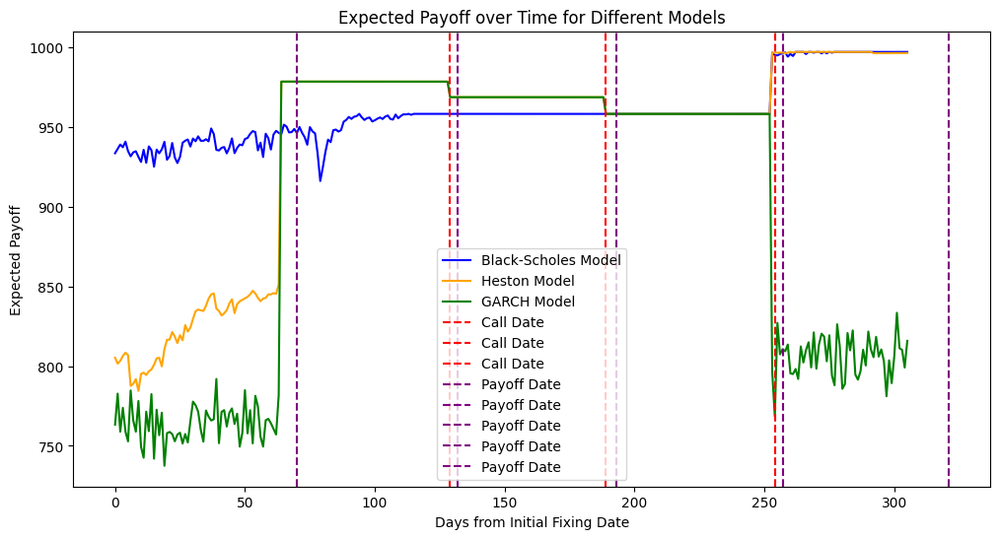

In [ ]:
# Plot the expected payoffs for each model
plt.figure(figsize=(12, 6))
plt.plot(payout_bs, label="Black-Scholes Model", color='blue')
plt.plot(payout_heston, label="Heston Model", color='orange')
plt.plot(payout_garch, label="GARCH Model", color='green')

# Mark call dates and payoff dates
for calling_date in calling_dates:
    plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
for payoff_date in payoff_dates:
    plt.axvline(x=payoff_date, color='purple', linestyle='--', label='Payoff Date')

plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")
plt.title("Expected Payoff over Time for Different Models")
plt.legend()
plt.show()

# Choosing the best model :)

### Under Black-Scholes Model

In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
theta_bs = returns.mean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 953.2562775722191


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 7395.680383826302


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
theta_bs = returns.mean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 954.6123878355622


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 7217.9571803942945


### Under Heston Model

In [ ]:
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
theta_heston = returns.mean()
print(f"Expected Payoff: {theta_heston}")

AttributeError: 'numpy.ndarray' object has no attribute 'clone'

In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
var_heston = (1 / (M - 1)) * ((returns - theta_heston) ** 2).sum()
print(f"Unbiased Variance under Heston: {var_heston}")

Unbiased Variance under Heston: 2.068158347217291e-25


In [ ]:
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
theta_heston = returns.mean()
print(f"Expected Payoff: {theta_heston}")

Expected Payoff: 997.2439271253169


In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
var_heston = (1 / (M - 1)) * ((returns - theta_heston) ** 2).sum()
print(f"Unbiased Variance under Heston: {var_heston}")

Unbiased Variance under Heston: 2.068158347217291e-25


### Under DCC-GARCH Model

In [ ]:
m = 317
garch_payoff = CallablePayoff(0, r=0.0419, S0=S0)

epochs = 100
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = garch.forecast(steps=m, num_paths=M, s0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        losses = garch_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.S0 = torch.log(torch.tensor(S0)) # In order of UNH, PFE, MRK
Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/4206900174.py:9: RuntimeWarning: divide by zero encountered in log
  path = np.log(path) # in asset, timestep, path
Training Progress:   1%|          | 1/100 [00:01<01:39,  1.01s/it, Worst loss=2.41e+5, Best Loss=3.72e+4]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12

In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1028.0277965899706


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/2670220049.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1028.0277965899706


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/2776428186.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


# Portfolio Optimization

### Under Black-Scholes Model

In [ ]:
delta = multi_bs.calculate_delta(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.numpy())
gamma = multi_bs.calculate_gamma(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.numpy())
print(f"Delta: {delta}, \nGamma: \n{gamma}")

Delta: [0.1294509  5.43405831 1.10170715], 
Gamma: 
[[-0.05465633  0.29945158  0.16789891]
 [-0.55286363 -5.12647454 -2.29603003]
 [ 0.09123741  1.29729775  0.54380679]]


### Under Heston Model

In [ ]:
delta = torch.empty(3)
for i in range(3):
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    up_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    down_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
    
    delta[i] = (up_payoff - down_payoff) / 0.02 / s0[i]
print('Payoff delta:', delta.tolist())

# Find gamma
gamma = torch.empty((3,3))
for i in range(3):
    for j in range(3):
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 1.01
        
        up1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up1_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 0.99
        
        down1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down1_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 1.01
        
        down2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down2_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 0.99
        
        up2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up2_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
        gamma[i,j] = (up1_payoff - down1_payoff - down2_payoff + up2_payoff) / (4 * 0.01**2 * s0[i] * s0[j])
print('Payoff gamma:', gamma.tolist())

put_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Put delta:', put_delta.tolist())

put_gamma = torch.empty((3,3))
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    
    mid_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    mid_put = torch.clamp(s0_temp[i]-mid_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - 2 * mid_put + down_put) / (0.04 * s0[i]**2)
print('Put gamma:', put_delta.tolist())

stock_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = up_paths[:,-1].nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = down_paths[:,-1].nanmean()
    
    stock_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Stock delta:', stock_delta.tolist())

/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path)


Payoff delta: [0.0, 0.0, 0.0]
Payoff gamma: [[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0]]
Put delta: [0.5042284126832787, 0.4866671128709058, 0.5000390362719435]
Put gamma: [-0.00041703139376549135, -0.008874789168498527, -0.0024746898487017885]
Stock delta: [0.0008429359689300237, 0.01830465966657334, 0.004993846492419437]


### Under DCC-GARCH 

# Risk Analysis

### Under Black-Scholes Model

In [ ]:
from helper import calculate_var_cvar
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 582.3998637132667, Conditional Value at Risk: 541.8704067464005


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 565.9817108226154, Conditional Value at Risk: 522.365688202961


### Under Heston Model

In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253164


In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253164


### Under DCC-GARCH Model

In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Value at Risk: 355.1886892214202, Conditional Value at Risk: 276.54324666511707


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/3197940339.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Value at Risk: 356.7143201537131, Conditional Value at Risk: 270.47810389712123


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_10331/3197940339.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)
